# Вариант №1

$$f(x)=\sqrt{x(l-x)}, c=1$$
$$l=0.8,  \rho=0.02,  N=0.04,  \alpha=0.38,  \beta=0.42$$

In [38]:
# deps
%pip install numpy matplotlib scipy pandas


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


## Задание 1

$f(x, t_0 = 0)$  и  $g(x, t_0 = 0)$

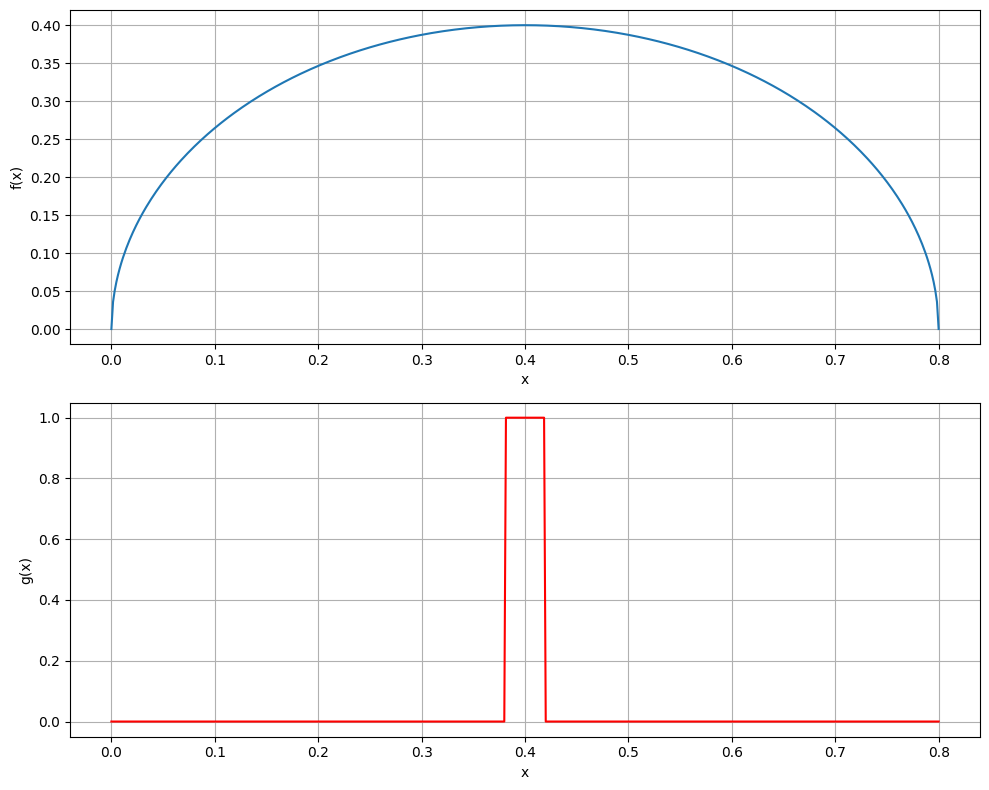

In [39]:
from scipy import integrate
import numpy as np
import math
import matplotlib.pyplot as plt
import pandas


LENGTH = 0.8    # l
STIFFNES = 0.04 # N - жесткость
DENSITY = 0.02  # rho - плотность
ALPHA = 0.38    
BETA = 0.42    

A = np.sqrt( STIFFNES / DENSITY ) # скорость волны 

c = 1           # начальная скорость


def f(x): 
    return np.sqrt(x*(LENGTH - x))

def g(x):
    return np.where((x >= ALPHA) & (x <= BETA), c, 0)

x = np.linspace(0, LENGTH, 500)

# Вычисляем значения функций
f_values = f(x)
g_values = g(x)

# Создаем фигуру и оси для графиков
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Строим график f(x)
ax1.plot(x, f_values, label='$f(x)$')
ax1.set_xlabel('x')
ax1.set_ylabel('f(x)')
ax1.grid(True)


# Строим график g(x)
ax2.plot(x, g_values, label='$g(x)$', color='red')
ax2.set_xlabel('x')
ax2.set_ylabel('g(x)')
ax2.grid(True)

# Настройка отображения
plt.tight_layout()
plt.show()

## Задание 2 

Найти $A_n$ $\omega_{n}$ при $n=1,2,3,4,5$

Частота гармоник демонстрирует нам с какой частотой колеблется каждая волна. Как она зависит от каждого показателя: 

l - чем больше длина тем ниже будет частота                                                                 
n - чем больше количество гармоник тем больше буедет частота                                        
a - скокорость с которой будет двигаться струна



$$\omega_{n} = \frac{n \pi}{l} \sqrt{\frac{N}{\rho}}$$

Данный коэфициент демонстрирует как начальное отклонение и то как оно влияет на отображение по отношению к синусоиде 

$$a_{n} = \frac{2}{l} \int_{0}^{l} f(x) \cdot sin\left( \frac{\pi n x}{l} \right) dx $$

Данный коэфициент демонстрирует как начальная скорость влияет на n-ую гармонику

$$b_{n} = \frac{2}{\pi n a} \int_{0}^{l} g(x) \cdot sin\left( \frac{\pi n x}{l} \right) dx$$

формула амплитуды

$$A_n=\sqrt{a_n^2 + b_n^2}$$

In [40]:
def w_n(num): 
    return (math.pi * num / LENGTH) * np.sqrt( STIFFNES / DENSITY )

def a_n(num):
    return 2/LENGTH * integrate.quad(lambda x: f(x) * np.sin((np.pi * num * x) / LENGTH ), 0, LENGTH)[0]

def b_n(num):
    return (2 / math.pi * num * A) * integrate.quad(lambda x: g(x) * math.sin( ( math.pi * num * x ) / LENGTH ), 0, LENGTH, points=[ALPHA, BETA])[0]

def A_n(num):
    return np.sqrt(a_n(num)** 2 + b_n(num)**2)

df = pandas.DataFrame(columns=['ω_n', 'a_n', 'b_n', 'A_n'])
df.index += 1

for n in range(1, 6):
    w = w_n(n)
    a = a_n(n)
    b = b_n(n)
    A = A_n(n)
    df.loc[n] = [w, a, b, A]

df

,ω_n,a_n,b_n,A_n
1,5.553604,4.534593e-01,3.597564e-02,4.548841e-01
2,11.107207,6.869543e-18,1.086048e-18,6.954864e-18
3,16.660811,7.510878e-02,-5.264100e-19,7.510878e-02
4,22.214415,4.795046e-17,-7.085779e-19,4.795569e-17
5,27.768018,3.380215e-02,5.950179e-18,3.380215e-02


## Задание 3

In [41]:
import matplotlib.animation as animation
from IPython.display import HTML

x = np.linspace(0, LENGTH, 500)
t = np.linspace(0, 2 * np.pi / w_n(1), 100)

fig, axs = plt.subplots(2, 3, figsize=(18, 8))
fig.suptitle('Движение струны для разных гармоник', fontsize=16)

# Удаляем последний subplot в нижнем ряду
fig.delaxes(axs[1, 2])

initial_us = [
    A_n(n) for n in range(1, 6)
]

def init():
    for n in range(1, 6):
        row = (n-1) // 3
        col = (n-1) % 3
        axs[row, col].set_title(f'Гармоника {n}')
        axs[row, col].set_xlabel('x')
        axs[row, col].set_ylabel('u(x, t)')
        axs[row, col].set_xlim(0, LENGTH)
        axs[row, col].set_ylim(-initial_us[n-1], initial_us[n-1])
    # Инициализация общего графика
    axs[1, 2] = fig.add_subplot(2, 3, 6)
    axs[1, 2].set_title('Все гармоники')
    axs[1, 2].set_xlabel('x')
    axs[1, 2].set_ylabel('u(x, t)')
    axs[1, 2].set_xlim(0, LENGTH)
    axs[1, 2].set_ylim(-1, 1)
    return []

def animate(i):
    frames = []
    for n in range(1, 6):
        row = (n-1) // 3
        col = (n-1) % 3
        axs[row, col].clear()
        axs[row, col].set_title(f'Гармоника {n}')
        axs[row, col].set_xlabel('x')
        axs[row, col].set_ylabel('u(x, t)')
        axs[row, col].set_xlim(0, LENGTH)
        axs[row, col].set_ylim(-initial_us[n-1], initial_us[n-1])
        
        u = A_n(n) * np.sin(w_n(n) * t[i]) * np.sin((np.pi * n * x) / LENGTH)
        line, = axs[row, col].plot(x, u, 'b')
        frames.append(line)
    
    # Обновление общего графика
    axs[1, 2].clear()
    axs[1, 2].set_title('Все гармоники')
    axs[1, 2].set_xlabel('x')
    axs[1, 2].set_ylabel('u(x, t)')
    axs[1, 2].set_xlim(0, LENGTH)
    axs[1, 2].set_ylim(-1, 1)
    
    total_u = np.zeros_like(x)
    for n in range(1, 6):
        u = A_n(n) * np.sin(w_n(n) * t[i]) * np.sin((np.pi * n * x) / LENGTH)
        total_u += u
        axs[1, 2].plot(x, u)
    
    return frames

ani = animation.FuncAnimation(fig, animate, frames=len(t), init_func=init, blit=True, interval=50)

plt.close()
HTML(ani.to_jshtml())

# Численный метод

In [43]:
n = 6                
h = LENGTH / n            
k = 0.001            
num_steps = 5        

r_squared = (k/h)**2 * (STIFFNES/DENSITY)

x_vals = np.linspace(0, LENGTH, n+1)
T = num_steps + 1

u = np.zeros((T, n+1))

for i in range(1, n):
    u[0, i] = f(x_vals[i])
u[0, 0] = 0
u[0, n] = 0

for i in range(1, n):
    u[1, i] = f(x_vals[i]) + k * g(x_vals[i])
u[1, 0] = 0
u[1, n] = 0

for j in range(1, T-1):
    for i in range(1, n):
        u[j+1, i] = 2*(1 - r_squared)*u[j, i] + r_squared*(u[j, i-1] + u[j, i+1]) - u[j-1, i]
    u[j+1, 0] = 0
    u[j+1, n] = 0

def wave_function(x, t):
    if np.isclose(x, 0) or np.isclose(x, LENGTH):
        return 0
    total = 0
    for n in range(1, 6):
        term = (a_n(n-1) * np.cos(np.pi * A_n(n-1) * n * t / LENGTH) +
                b_n(n-1) * np.sin(np.pi * A_n(n-1) * n * t / LENGTH)) * np.sin(np.pi * n * x / LENGTH)
        total += term
    return total

for j in range(T):
    t_val = j * k
    print("t = {:.3f}:".format(t_val))
    print("-"*10)
    for i in range(n+1):
        print("u({:.3f}, t) | {:.6f} | {:.6f}".format(
            x_vals[i], u[j, i], wave_function(x_vals[i], t_val)))
    print()

t = 0.000:
----------
u(0.000, t) | 0.000000 | 0.000000
u(0.133, t) | 0.298142 | 0.457753
u(0.267, t) | 0.377124 | 0.327661
u(0.400, t) | 0.400000 | 0.000000
u(0.533, t) | 0.377124 | -0.327661
u(0.667, t) | 0.298142 | -0.457753
u(0.800, t) | 0.000000 | 0.000000

t = 0.001:
----------
u(0.000, t) | 0.000000 | 0.000000
u(0.133, t) | 0.298142 | 0.457751
u(0.267, t) | 0.377124 | 0.327664
u(0.400, t) | 0.401000 | 0.000000
u(0.533, t) | 0.377124 | -0.327664
u(0.667, t) | 0.298142 | -0.457751
u(0.800, t) | 0.000000 | 0.000000

t = 0.002:
----------
u(0.000, t) | 0.000000 | 0.000000
u(0.133, t) | 0.298118 | 0.457743
u(0.267, t) | 0.377117 | 0.327662
u(0.400, t) | 0.401995 | 0.000000
u(0.533, t) | 0.377117 | -0.327662
u(0.667, t) | 0.298118 | -0.457743
u(0.800, t) | 0.000000 | 0.000000

t = 0.003:
----------
u(0.000, t) | 0.000000 | 0.000000
u(0.133, t) | 0.298068 | 0.457731
u(0.267, t) | 0.377105 | 0.327655
u(0.400, t) | 0.402984 | 0.000000
u(0.533, t) | 0.377105 | -0.327655
u(0.667, t) | 0.29